In [47]:
library(dplyr)   
library(caret)
library(tidyverse)
library(car)
library(MASS) # for chisq
library(descr) # for crosstable

options(repr.plot.width = 20, repr.plot.height =10, repr.plot.res = 500)

load(file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/df_iniziale.Rdata")
df <- DatiUsati1
rm(DatiUsati1)

In [48]:
load(file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/df2022.Rdata")
df_val <- df2022
rm(df2022) #dati 2022

In [49]:
dim(df)

[1] 1453 1874

In [50]:
dim(df_val)

[1]  414 2011

In [51]:
df <- df[c("patientKey","icuAdmDate__icuAdmDate","icuAdmDate__icuAdmTime","centreCode","genderClear","age","degenzaPreTra","admWard_RIC_PED",
           "typeStatus_RIC","pulmonarHypertension","epatopulmonarSyndrome",
           "BleedingEsophagGastric","prevLiverTransplant","presentRefractAscites","tipps",
           "thrombosisDegreeWithNone","portosystEncephalPresent","nutritStatus",
           "surgeonSurgery","mechanicVentilation","clifSofaForCardio","albumInfusOver7Days",
           "bilirubinaTotale","INR","serumCreatinine","Sodiemia","ratioPaO2FiO2","platCountTranspl","albumina",
           "surgeryDuration","IntraoperativTransfected","plasmaFresco","plasmaPools","doseFibrinogen","CRIOprecipitated",
           "useEmorecuper","CristalloidiComp","ColloidiComp","Albumina50Comp",
           "noradrenalineEndSurger","intermedLactates","coldIschemia","syndromeReperfus",
           "shuntPortedTemp", "anastomTechnic","venousBypass","bileAnastomosis","abdomOpenEndSurg",
           "organDonorSex","organDonorType","organDonorSampleTechnic","organDonorECMO",
           "regionalPerfusion","organDonorBiopsy","organDonorRecondOrgan",
           "organDonorProvenance","organDonorCauseOfDeath","organDonorAge", "organDonorHeight",
           "organDonorDrawalSodiemia","organDonorGammaGT","realMELD","realMELDNa","DRI","EDRI", "degenzaPostTraOSP",
           "hospOutcome_RIC","icuMortality",
           "liverDisords_buddChiariSyndrome","liverDisords_cirrhosisAlcoholic","liverDisords_cirrhosisAutoimmune","liverDisords_cirrhosisBiliaryPrimitiv",
              "liverDisords_cirrhosisBiliarySecond","liverDisords_cirrhosisCryptogenetic","liverDisords_cirrhosisDrugs","liverDisords_cirrhosisOtherRaison",
              "liverDisords_cirrhosisVirusB","liverDisords_cirrhosisVirusC","liverDisords_cirrhosisVirusD","liverDisords_cirrhosisVirusOther","liverDisords_extraEpathiBileDucts",
              "liverDisords_HCCstageI","liverDisords_HCCstageII","liverDisords_Hemochromatosis","liverDisords_hepatFulm","liverDisords_NASHpathology",
              "liverDisords_otherCholestaticDisease","liverDisords_otherCongenitBilia","liverDisords_otherIndication","liverDisords_polycysticDisease",
              "liverDisords_primitScleroColangitis","liverDisords_subAcute","liverDisords_wilsonDisease",
          "tip_ritr","oxygenTherapy","frequency","degree","organDonorMaastricht",
           "organDonorSteadyMacroscopic","organDonorRecondHypoNormoter",
          "comorbidities_none_RIC","comorbidities_asthma_RIC","comorbidities_modCOPD_RIC","comorbidities_sevCOPD_RIC",
        "comorbidities_restLunDis_RIC","comorbidities_hypertension_RIC","comorbidities_myocard_RIC","comorbidities_heartFail2_RIC",
        "comorbidities_heartFail4_RIC","comorbidities_arrhythmia_RIC","comorbidities_perVascDis_RIC","comorbidities_dementia_RIC",
        "comorbidities_cerDis_RIC","comorbidities_hemiParaQuadr_RIC","comorbidities_neuro_RIC","comorbidities_modRenal_RIC",
        "comorbidities_diab1_RIC","comorbidities_diab2NoIns_RIC","comorbidities_diab2Ins_RIC","comorbidities_drugIndCoag_RIC",
        "comorbidities_antiaggrTherapy_RIC","comorbidities_severePsychosis_RIC")]

In [52]:
df_val <- df_val[c("patientKey","icuAdmDate__icuAdmDate","icuAdmDate__icuAdmTime","centreCode","genderClear","age","degenzaPreTra","admWard_RIC_PED",
           "typeStatus_RIC","pulmonarHypertension","epatopulmonarSyndrome",
           "BleedingEsophagGastric","prevLiverTransplant","presentRefractAscites","tipps",
           "thrombosisDegreeWithNone","portosystEncephalPresent","nutritStatus",
           "surgeonSurgery","mechanicVentilation","clifSofaForCardio","albumInfusOver7Days",
           "bilirubinaTotale","INR","serumCreatinine","Sodiemia","ratioPaO2FiO2","platCountTranspl","albumina",
           "surgeryDuration","IntraoperativTransfected","plasmaFresco","plasmaPools","doseFibrinogen","CRIOprecipitated",
           "useEmorecuper","CristalloidiComp","ColloidiComp","Albumina50Comp",
           "noradrenalineEndSurger","intermedLactates","coldIschemia","syndromeReperfus",
           "shuntPortedTemp", "anastomTechnic","venousBypass","bileAnastomosis","abdomOpenEndSurg",
           "organDonorSex","organDonorType","organDonorSampleTechnic","organDonorECMO",
           "regionalPerfusion","organDonorBiopsy","organDonorRecondOrgan",
           "organDonorProvenance","organDonorCauseOfDeath","organDonorAge", "organDonorHeight",
           "organDonorDrawalSodiemia","organDonorGammaGT","realMELD","realMELDNa","DRI","EDRI", "degenzaPostTraOSP",
           "hospOutcome_RIC","icuMortality",
           "liverDisords_buddChiariSyndrome","liverDisords_cirrhosisAlcoholic","liverDisords_cirrhosisAutoimmune","liverDisords_cirrhosisBiliaryPrimitiv",
              "liverDisords_cirrhosisBiliarySecond","liverDisords_cirrhosisCryptogenetic","liverDisords_cirrhosisDrugs","liverDisords_cirrhosisOtherRaison",
              "liverDisords_cirrhosisVirusB","liverDisords_cirrhosisVirusC","liverDisords_cirrhosisVirusD","liverDisords_cirrhosisVirusOther","liverDisords_extraEpathiBileDucts",
              "liverDisords_HCCstageI","liverDisords_HCCstageII","liverDisords_Hemochromatosis","liverDisords_hepatFulm","liverDisords_NASHpathology",
              "liverDisords_otherCholestaticDisease","liverDisords_otherCongenitBilia","liverDisords_otherIndication","liverDisords_polycysticDisease",
              "liverDisords_primitScleroColangitis","liverDisords_subAcute","liverDisords_wilsonDisease",
          "tip_ritr","oxygenTherapy","frequency","degree","organDonorMaastricht",
           "organDonorSteadyMacroscopic","organDonorRecondHypoNormoter",
          "comorbidities_none_RIC","comorbidities_asthma_RIC","comorbidities_modCOPD_RIC","comorbidities_sevCOPD_RIC",
        "comorbidities_restLunDis_RIC","comorbidities_hypertension_RIC","comorbidities_myocard_RIC","comorbidities_heartFail2_RIC",
        "comorbidities_heartFail4_RIC","comorbidities_arrhythmia_RIC","comorbidities_perVascDis_RIC","comorbidities_dementia_RIC",
        "comorbidities_cerDis_RIC","comorbidities_hemiParaQuadr_RIC","comorbidities_neuro_RIC","comorbidities_modRenal_RIC",
        "comorbidities_diab1_RIC","comorbidities_diab2NoIns_RIC","comorbidities_diab2Ins_RIC","comorbidities_drugIndCoag_RIC",
        "comorbidities_antiaggrTherapy_RIC","comorbidities_severePsychosis_RIC")]

In [53]:
df <- rbind(df,df_val) #unisco dati 2018-2021 con quelli del 2022

In [54]:
# colestatiche




df <-  df %>% 
  mutate(colestatiche = case_when(liverDisords_cirrhosisBiliaryPrimitiv==1|liverDisords_cirrhosisBiliarySecond==1|
                                  liverDisords_primitScleroColangitis==1|
          liverDisords_extraEpathiBileDucts==1|liverDisords_otherCongenitBilia==1|
                                  liverDisords_otherCholestaticDisease==1~ 1,
                                  TRUE~ 0))

df$colestatiche <- as.factor(df$colestatiche)

df <- subset(df, select= - c(liverDisords_cirrhosisBiliaryPrimitiv,liverDisords_cirrhosisBiliarySecond,
                             liverDisords_primitScleroColangitis,liverDisords_extraEpathiBileDucts,
                            liverDisords_otherCongenitBilia, liverDisords_otherCholestaticDisease))



#rare

df <-  df %>% 
  mutate(rare = case_when(liverDisords_Hemochromatosis == 1|liverDisords_cirrhosisCryptogenetic == 1|
    liverDisords_cirrhosisOtherRaison == 1|liverDisords_otherIndication == 1|liverDisords_wilsonDisease == 1|
    liverDisords_cirrhosisDrugs == 1| liverDisords_buddChiariSyndrome == 1 | 
                          liverDisords_polycysticDisease == 1 | liverDisords_cirrhosisAutoimmune == 1 ~ 1,
                          TRUE ~ 0))

df$rare <- as.factor(df$rare)

df <- subset(df, select= - c(liverDisords_Hemochromatosis,liverDisords_cirrhosisCryptogenetic,
                             liverDisords_cirrhosisOtherRaison,liverDisords_otherIndication,liverDisords_wilsonDisease,
                            liverDisords_buddChiariSyndrome,liverDisords_polycysticDisease,liverDisords_cirrhosisAutoimmune))


#virali

df <-  df %>% 
  mutate(virali = case_when(liverDisords_cirrhosisVirusC == 1|liverDisords_cirrhosisVirusB == 1|
                            liverDisords_cirrhosisVirusD == 1|
                            liverDisords_cirrhosisVirusOther == 1 ~ 1,
                            TRUE ~ 0))

df$virali <- as.factor(df$virali)

df <- subset(df, select= - c(liverDisords_cirrhosisVirusC,liverDisords_cirrhosisVirusB,
                             liverDisords_cirrhosisVirusD,liverDisords_cirrhosisVirusOther))



#tumore

df <-  df %>% 
  mutate(tumore = case_when(liverDisords_HCCstageI == 1 | liverDisords_HCCstageII == 1 ~ 1,                 
                            TRUE ~ 0))

df$tumore <- as.factor(df$tumore)

df <- subset(df, select= - c(liverDisords_HCCstageI,liverDisords_HCCstageII))

In [55]:
#respiratorie

df <- df %>% 
    mutate(comorbidities_respiratorie = ifelse( comorbidities_asthma_RIC == 1 | comorbidities_modCOPD_RIC == 1 |
                                               comorbidities_sevCOPD_RIC == 1 | comorbidities_restLunDis_RIC == 1 |
                                               oxygenTherapy == "responsYes", 1, 0))

df$comorbidities_respiratorie <- as.factor(df$comorbidities_respiratorie)
df <- subset(df, select = -c(comorbidities_asthma_RIC,comorbidities_modCOPD_RIC, comorbidities_sevCOPD_RIC, 
                             comorbidities_restLunDis_RIC, oxygenTherapy ))






#cardiovascolari

df <- df %>% 
    mutate(comorbidities_cardiovascolari = ifelse( comorbidities_myocard_RIC == 1 | comorbidities_heartFail2_RIC == 1 |
                                               comorbidities_heartFail4_RIC == 1 | comorbidities_arrhythmia_RIC == 1 |
                                               comorbidities_perVascDis_RIC == 1, 1, 0))

df$comorbidities_cardiovascolari <- as.factor(df$comorbidities_cardiovascolari)
df <- subset(df, select = -c(comorbidities_myocard_RIC,comorbidities_heartFail2_RIC, comorbidities_heartFail4_RIC, 
                             comorbidities_arrhythmia_RIC, comorbidities_perVascDis_RIC ))


#neurologiche

df <- df %>% 
    mutate(comorbidities_neurologiche = ifelse( comorbidities_dementia_RIC == 1 | comorbidities_cerDis_RIC == 1 |
                                               comorbidities_hemiParaQuadr_RIC == 1 | comorbidities_neuro_RIC == 1 , 1, 0))

df$comorbidities_neurologiche <- as.factor(df$comorbidities_neurologiche)
df <- subset(df, select = -c(comorbidities_dementia_RIC,comorbidities_cerDis_RIC, comorbidities_hemiParaQuadr_RIC, 
                             comorbidities_neuro_RIC))


#renali

df <- df %>% 
    mutate(comorbidities_renali = ifelse( comorbidities_modRenal_RIC == 1 | comorbidities_modRenal_RIC == 1, 1, 0))

df$comorbidities_renali <- as.factor(df$comorbidities_renali)
df <- subset(df, select = -c(comorbidities_modRenal_RIC,comorbidities_modRenal_RIC))


#endocrine

df <-  df %>% 
  mutate(comorbidities_diabete = case_when(comorbidities_diab2NoIns_RIC == 1 ~ 1,
  comorbidities_diab1_RIC == 0 & comorbidities_diab2Ins_RIC == 0 & comorbidities_diab2NoIns_RIC == 0 ~ 0,
  comorbidities_diab1_RIC == 1 |comorbidities_diab2Ins_RIC == 1 ~ 2))

df$comorbidities_diabete <- as.factor(df$comorbidities_diabete)
df <- subset(df, select= - c(comorbidities_diab1_RIC,comorbidities_diab2Ins_RIC,comorbidities_diab2NoIns_RIC))

#scoagulazione

df <- df %>% 
    mutate(comorbidities_scoagulazione = ifelse( comorbidities_drugIndCoag_RIC == 1 |
                                                comorbidities_antiaggrTherapy_RIC == 1 , 1, 0))

df$comorbidities_scoagulazione <- as.factor(df$comorbidities_scoagulazione)
df <- subset(df, select = -c(comorbidities_drugIndCoag_RIC,comorbidities_antiaggrTherapy_RIC))

In [56]:
aggregate(sapply(df,class), by=list(sapply(df,class)), FUN=length)

Group.1,x
character,3
Date,1
factor,57
numeric,31


In [57]:
colnames(select_if(df, function(col) is.character(col)))

[1] "patientKey"             "icuAdmDate__icuAdmTime" "centreCode"

In [58]:
df$CentreCode <- as.factor(df$centreCode)

In [59]:
tmp <- unname(unlist(quantile(df$degenzaPostTraOSP, probs = c(0.9), na.rm=TRUE)))
df <- df %>% mutate(degenzaPostTraOSP = case_when(hospOutcome_RIC  %in% "hospDead" ~ tmp,
                                                  icuMortality %in% 1 ~ tmp,
                                                  TRUE ~ degenzaPostTraOSP))  #add penalty in degenzaPostTraOSP for patients who died

In [60]:
df1 <- df %>% filter(degenzaPostTraOSP <= 12)

df2 <- df %>% filter(degenzaPostTraOSP > 12)

In [61]:
paste("I pazienti con degenza minore o uguale a 12 giorni sono", nrow(df1))
paste("I pazienti con degenza superiore a 12 giorni", nrow(df2))

[1] "I pazienti con degenza minore o uguale a 12 giorni sono 582"

[1] "I pazienti con degenza superiore a 12 giorni 1099"

In [62]:
# Data

print("<= 12")
summary(df1$icuAdmDate__icuAdmDate)

print("> 12")
summary(df2$icuAdmDate__icuAdmDate)

[1] "<= 12"


Min.      1st Qu.       Median         Mean      3rd Qu.         Max. 
"2018-01-05" "2019-12-02" "2020-12-25" "2020-11-12" "2021-10-14" "2022-12-02"

[1] "> 12"


Min.      1st Qu.       Median         Mean      3rd Qu.         Max. 
"2018-01-01" "2019-10-13" "2020-10-07" "2020-09-25" "2021-09-22" "2022-12-16"

In [63]:
# Orario (è una variabile "character" quindi posso confrontare solo in questo modo senza fare ulteriori modifche)

print("<= 12")
table(df1$icuAdmDate__icuAdmTime)

print("> 12")
table(df2$icuAdmDate__icuAdmTime)

[1] "<= 12"



00:05 00:10 00:15 00:28 00:30 00:34 00:45 00:50 01:00 01:02 01:15 01:25 01:26 
    1     1     2     1     2     1     1     1     3     1     1     2     1 
01:27 01:29 01:30 01:35 01:45 01:53 01:57 02:00 02:10 02:15 02:30 02:45 02:49 
    1     1     4     1     2     1     1     6     1     2     2     1     1 
02:59 03:00 03:07 03:10 03:12 03:18 03:29 03:30 03:36 03:43 03:45 03:56 04:00 
    1     2     1     1     1     1     1     1     1     1     1     1     5 
04:30 04:33 04:35 04:42 05:00 05:05 05:10 05:35 05:53 06:00 06:25 06:27 06:30 
    3     1     1     1     2     1     1     1     1     1     1     1     2 
06:59 07:30 07:49 08:30 08:49 09:10 09:30 10:00 10:10 10:30 10:44 11:00 11:19 
    1     1     1     1     1     1     1     5     2     1     1     1     1 
11:24 11:30 11:36 11:45 11:58 12:00 12:03 12:05 12:13 12:15 12:21 12:25 12:30 
    1     1     1     1     1     5     1     1     1     1     1     1     4 
12:32 12:35 12:36 12:38 12:42 12:48 12:53 12:57 12:

[1] "> 12"



00:00 00:10 00:15 00:20 00:23 00:25 00:30 00:31 00:35 00:40 00:45 00:50 00:56 
    1     2     1     4     1     1     4     1     1     1     1     2     1 
01:00 01:10 01:17 01:23 01:24 01:29 01:30 01:35 01:40 01:42 01:45 01:46 01:50 
   10     1     1     1     1     1     9     1     1     1     2     1     1 
02:00 02:10 02:28 02:30 02:40 03:00 03:29 03:30 03:31 03:40 03:50 03:53 03:56 
    8     1     1     1     1     6     1     4     1     1     3     1     1 
04:00 04:01 04:07 04:14 04:15 04:24 04:25 04:30 04:36 04:45 04:56 04:58 05:00 
    5     1     1     1     1     1     1     4     1     1     1     1     5 
05:15 05:18 05:30 05:41 05:47 05:50 06:00 06:13 06:20 06:22 06:30 06:37 06:45 
    1     1     1     1     1     1     3     1     1     1     2     1     2 
07:00 07:01 07:07 07:10 07:11 07:15 07:25 07:27 07:30 07:33 07:35 07:40 08:00 
    3     1     1     3     1     1     1     1     3     1     1     1     8 
08:09 08:24 08:30 08:50 09:00 09:25 09:30 09:42 10:

In [87]:
descrittiva_discrete <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {
            
            par(mfrow=c(1,2))
            barplot(table(df1[[column]])/nrow(df1), main="<= 12", col="blue", ylim = c(0, 1))

            barplot(table(df2[[column]])/nrow(df2), main="> 12", col="blue", ylim = c(0, 1))
            
            
            mtext(column, side = 3, line = - 2, outer = TRUE)
            
        }
        
}




descrittiva_continue <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {


            print("<= 12")
            print(column)
            print(summary(df1[[column]]))

            print("> 12")
            print(column)
            print(summary(df2[[column]]))
            print(wilcox.test(df1[[column]], df2[[column]]))
            
            tmp <- rbind(df1[[column]], df2[[column]])
            cat("deviazione standard: ",sd(tmp,na.rm =TRUE))
            
            cat("\n\n\n\n")
            
        }
}

descrittiva_discrete2 <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {

            a <- table(factor(df1[[column]], levels = union(names(table(df2[[column]])),names(table(df1[[column]])))))
            b <- table(df2[[column]])
            
            print(column)
            print("<= 12")
            print(prop.table(a))
            
            print("> 12")
            print(prop.table(b))
        
            print(ks.test(a,b))
            
            cat("\n\n\n\n")
    }
}


descrittiva_discrete3 <- function(df1, df2){
        column_names <- colnames(df1)
        
        for (column in column_names) {

            a <- table(factor(df1[[column]], levels = union(names(table(df2[[column]])),names(table(df1[[column]])))))
            b <- table(df2[[column]])
            
            print(column)
        
            print(CrossTable(rbind(a, b),
           fisher = T, chisq = T, expected = T,
           prop.c = F, prop.t = F, prop.chisq = F, 
           sresid = T, format = 'SPSS', simulate.p.value=TRUE))
            
            cat("\n\n\n\n")
    }
}

In [81]:
descrittiva_discrete_tot <- function(df){
        column_names <- colnames(df)
        
        for (column in column_names) {
            
            barplot(table(df[[column]])/nrow(df), main="tot", col="blue", ylim = c(0, 1))
            
            
            mtext(column, side = 3, line = - 2, outer = TRUE)
            
        }
        
}




descrittiva_continue_tot <- function(df){
        column_names <- colnames(df)
        
        for (column in column_names) {


            print("tot")
            print(column)
            print(summary(df[[column]]))


            cat("\n\n\n\n")
            
        }
}

descrittiva_discrete2_tot <- function(df){
        column_names <- colnames(df)
        
        for (column in column_names) {
            
            a <- table(df[[column]])
            
            print(column)
            print("tot")
            print(prop.table(a))
            
            cat("\n\n\n\n")
    }
}




In [82]:
df_discrete1 <- select_if(df1, function(col) is.factor(col))
df_discrete2 <- select_if(df2, function(col) is.factor(col))
                          
                          
df_continue1 <- select_if(df1, function(col) is.numeric(col))
df_continue2 <- select_if(df2, function(col) is.numeric(col))
                          
df_continue_tot <- select_if(df, function(col) is.numeric(col))
df_discrete_tot <- select_if(df, function(col) is.factor(col))

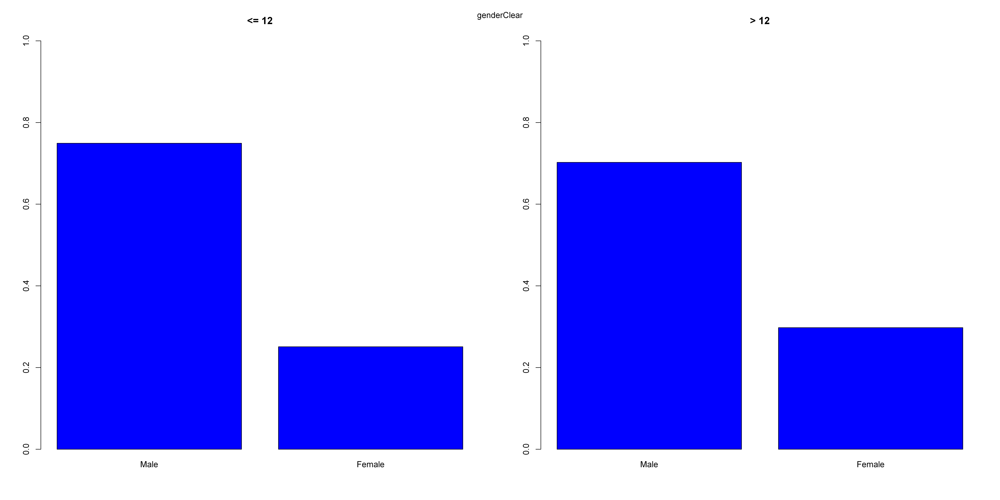

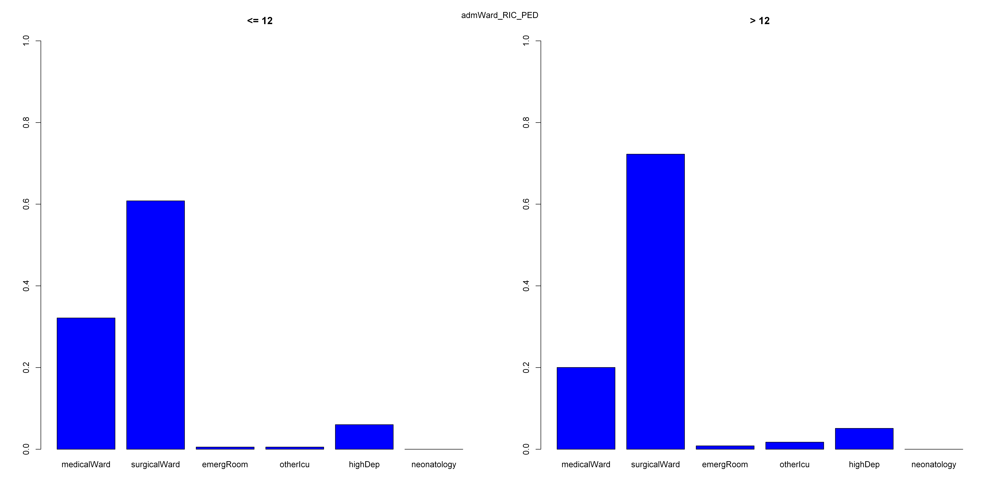

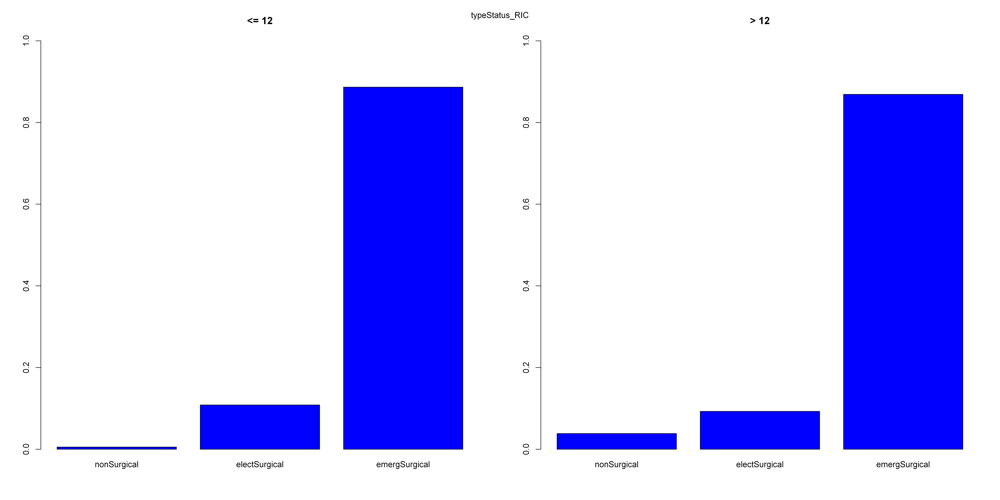

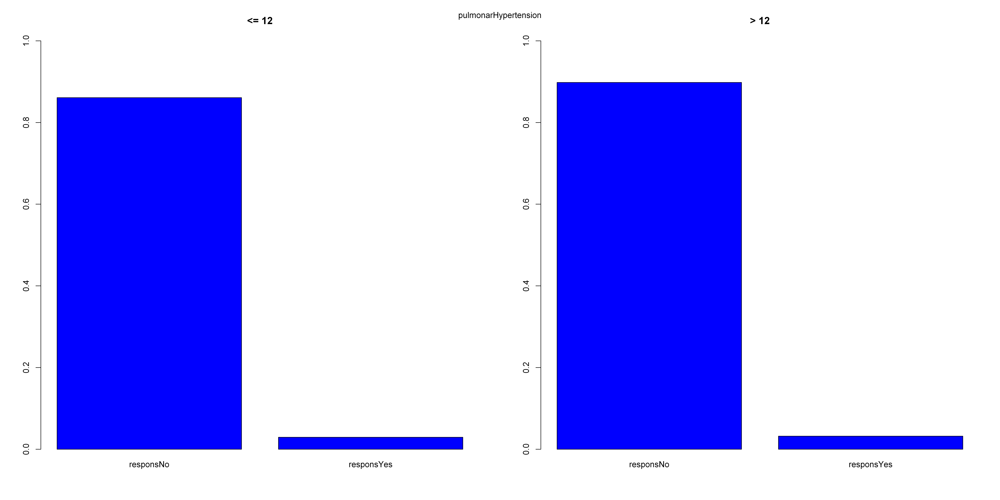

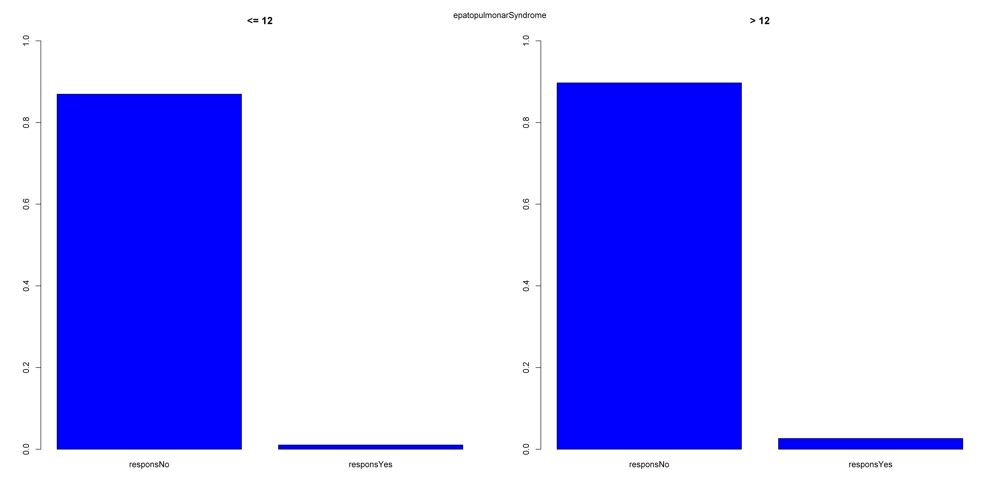

...

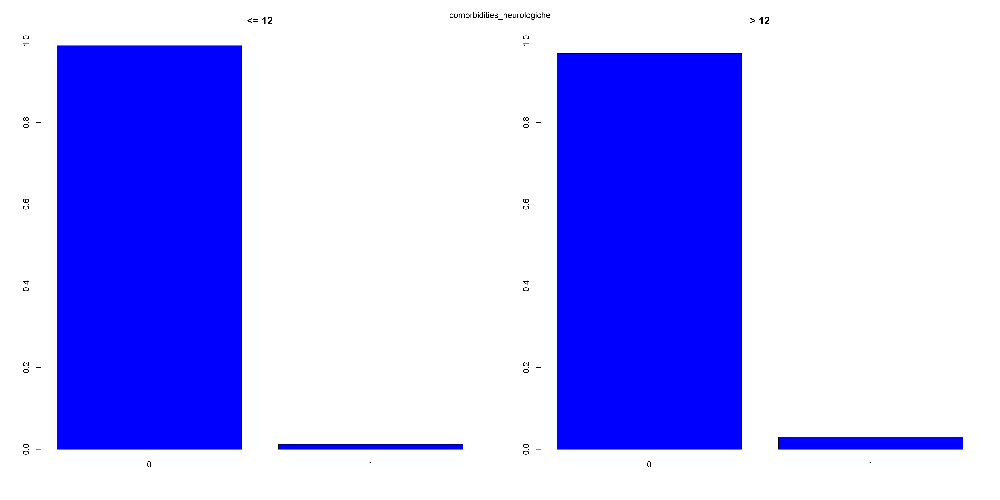

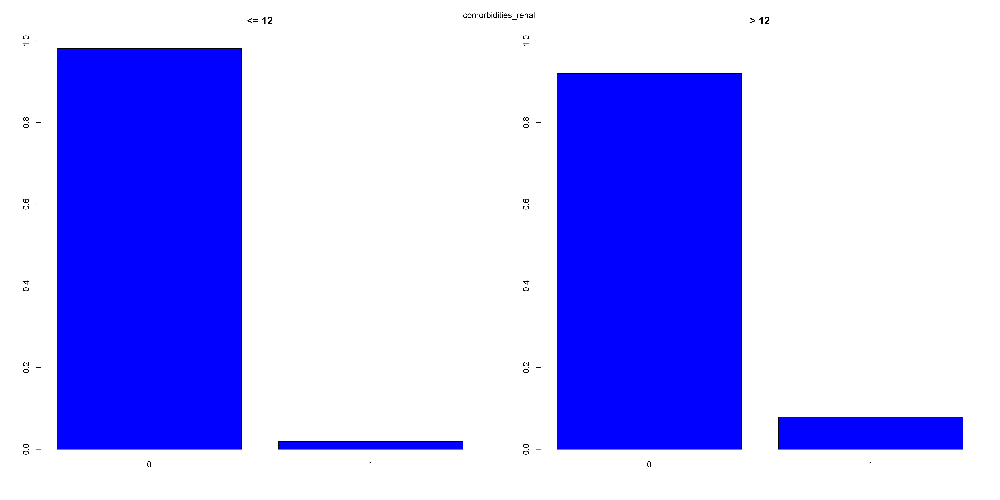

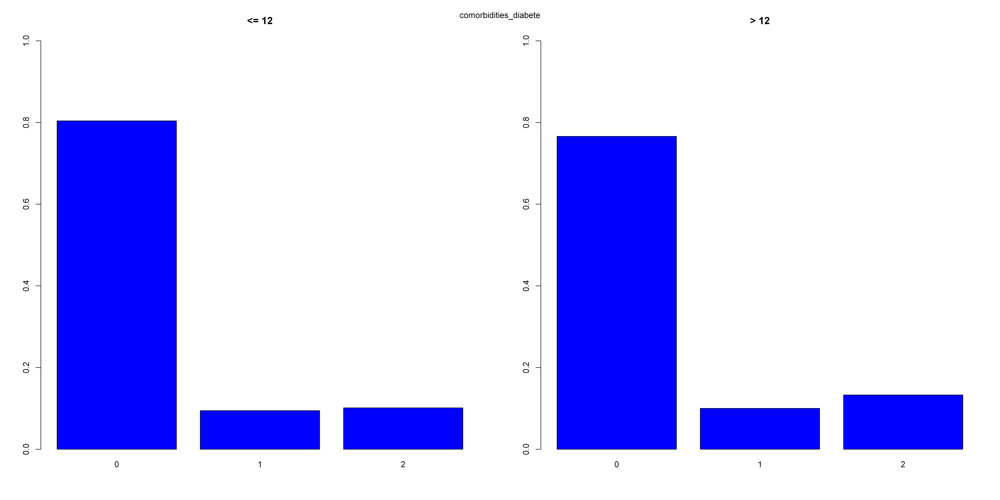

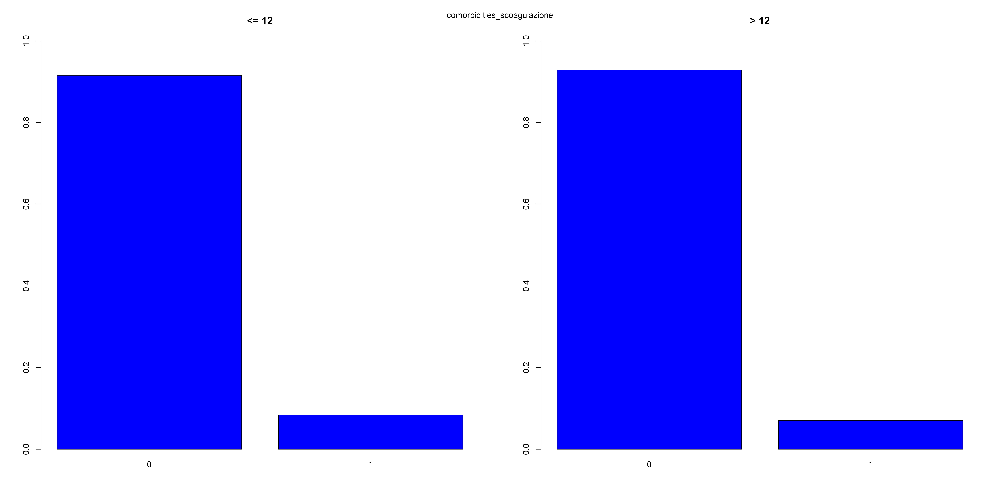

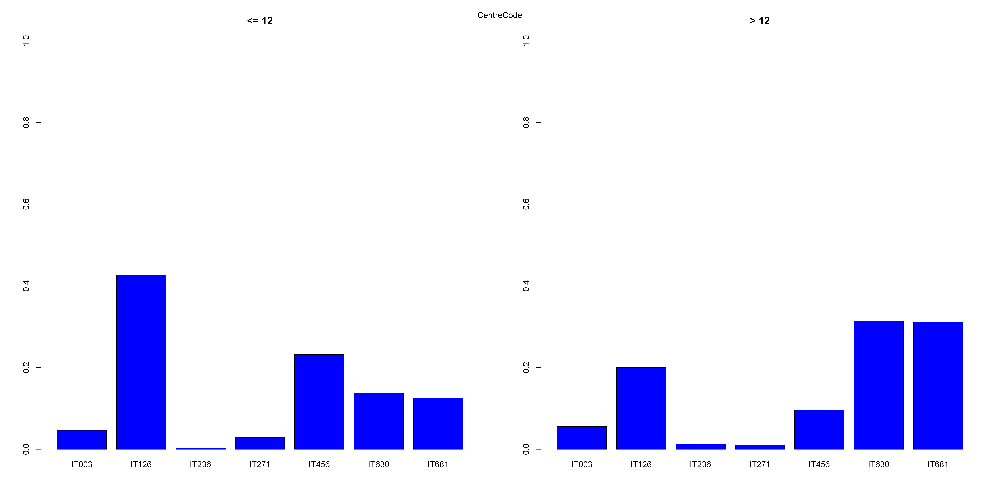

In [83]:
descrittiva_discrete(df_discrete1,df_discrete2)

In [84]:
descrittiva_discrete2(df_discrete1,df_discrete2)

[1] "genderClear"
[1] "<= 12"

     Male    Female 
0.7491409 0.2508591 
[1] "> 12"

     Male    Female 
0.7024568 0.2975432 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "admWard_RIC_PED"
[1] "<= 12"

 medicalWard surgicalWard    emergRoom     otherIcu      highDep  neonatology 
 0.321305842  0.608247423  0.005154639  0.005154639  0.060137457  0.000000000 
[1] "> 12"

 medicalWard surgicalWard    emergRoom     otherIcu      highDep  neonatology 
 0.200364299  0.723132969  0.008196721  0.017304189  0.051001821  0.000000000 


Warning message in ks.test(a, b):
"cannot compute exact p-value with ties"



	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.33333, p-value = 0.8928
alternative hypothesis: two-sided





[1] "typeStatus_RIC"
[1] "<= 12"

  nonSurgical electSurgical emergSurgical 
  0.005154639   0.108247423   0.886597938 
[1] "> 12"

  nonSurgical electSurgical emergSurgical 
   0.03821656    0.09281165    0.86897179 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.33333, p-value = 1
alternative hypothesis: two-sided





[1] "pulmonarHypertension"
[1] "<= 12"

 responsNo responsYes 
0.96718147 0.03281853 
[1] "> 12"

 responsNo responsYes 
0.96575342 0.03424658 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "epatopulmonarSyndrome"
[1] "<= 12"

 responsNo responsYes 
0.98828125 0.01171875 
[1] "> 12"

 responsNo responsYes 
0.97142857 0.02857143 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "BleedingEsophagGastric"

Warning message in ks.test(a, b):
"cannot compute exact p-value with ties"



	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.4, p-value = 0.8186
alternative hypothesis: two-sided





[1] "organDonorSteadyMacroscopic"
[1] "<= 12"

   under30     30to60      sup60 
0.93827160 0.05864198 0.00308642 
[1] "> 12"

    under30      30to60       sup60 
0.927652733 0.069131833 0.003215434 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.33333, p-value = 1
alternative hypothesis: two-sided





[1] "organDonorRecondHypoNormoter"
[1] "<= 12"

   Oxygenated NotOxygenated 
   0.94339623    0.05660377 
[1] "> 12"

   Oxygenated NotOxygenated 
   0.91525424    0.08474576 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "comorbidities_none_RIC"
[1] "<= 12"

        1         0 
0.1065292 0.8934708 
[1] "> 12"

         1          0 
0.05100182 0.94899818 

	Two-sample Kolmogorov-Smirnov test

data:  a and b
D = 0.5, p-value = 1
alternative hypothesis: two-sided





[1] "comorbidities_h

In [85]:
descrittiva_discrete3(df_discrete1,df_discrete2)

[1] "genderClear"
   Cell Contents 
|-------------------------|
|                   Count | 
|         Expected Values | 
|             Row Percent | 
|            Std Residual | 
|-------------------------|

           Male   Female   Total
--------------------------------
a          436      146     582 
         418.2    163.8         
          74.9%    25.1%   34.6%
         0.869   -1.388         
--------------------------------
b          772      327    1099 
         789.8    309.2         
          70.2%    29.8%   65.4%
        -0.632    1.010         
--------------------------------
Total     1208      473    1681 

Statistics for All Table Factors

Pearson's Chi-squared test with simulated p-value
	 (based on 2000 replicates) 
------------------------------------------------------------
Chi^2 = 4.101083      d.f. = NA      p = 0.0525 

Pearson's Chi-squared test with simulated p-value
	 (based on 2000 replicates) 
--------------------------------------------------------

Warning message in chisq.test(tab, correct = FALSE, ...):
"cannot compute simulated p-value with zero marginals"
Warning message in chisq.test(tab, correct = FALSE, ...):
"Chi-squared approximation may be incorrect"


   Cell Contents 
|-------------------------|
|                   Count | 
|         Expected Values | 
|             Row Percent | 
|            Std Residual | 
|-------------------------|

         medclWrd   srgclWrd   emergRom   otherIcu   highDep   neontlgy    Total
--------------------------------------------------------------------------------
a            187        354          3          3        35          0      582 
           141.0      397.7        4.2        7.6      31.5        0.0          
            32.1%      60.8%       0.5%       0.5%      6.0%       0.0%    34.6%
           3.874     -2.191     -0.568     -1.674     0.619        NaN          
--------------------------------------------------------------------------------
b            220        794          9         19        56          0     1098 
           266.0      750.3        7.8       14.4      59.5        0.0          
            20.0%      72.3%       0.8%       1.7%      5.1%       0.0%    65.4%

In [88]:
descrittiva_continue(df_continue1, df_continue2)

[1] "<= 12"
[1] "age"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  14.00   53.00   59.00   57.08   65.00   75.00 
[1] "> 12"
[1] "age"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   3.00   52.00   58.00   56.02   63.00   75.00 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 345429, p-value = 0.006776
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  10.2895



[1] "<= 12"
[1] "degenzaPreTra"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   1.000   2.986   1.000 365.000 
[1] "> 12"
[1] "degenzaPreTra"
    Min.  1st Qu.   Median     Mean  3rd Qu.     Max.     NA's 
-260.000    0.000    1.000    7.707    5.000  304.000        1 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 261406, p-value = 4.55e-11
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  17.93874



[1] "<= 12"
[1] "bilirubinaTotale"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.200   0.740   1.200   2.789   2.515  88.000      66 
[1] "> 12"
[1] "bilirubinaTotale"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.100   1.228   2.915   7.251   8.510  57.000      79 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 166625, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  8.424524



[1] "<= 12"
[1] "INR"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.900   1.120   1.250   1.403   1.470   6.870      66 
[1] "> 12"
[1] "INR"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.800   1.250   1.500   1.706   1.940  10.000      79 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 171217, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  0.6726204



[1] "<= 12"
[1] "serumCreatinine"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
 0.3600  0.7000  0.8200  0.9089  0.9625 10.7200      66 
[1] "> 12"
[1] "serumCreatinine"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   0.23    0.72    0.91    1.18    1.23    7.80      78 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 210579, p-value = 1.268e-10
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  0.7718086



[1] "<= 12"
[1] "Sodiemia"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  122.0   137.0   139.0   138.6   141.0   153.0      68 
[1] "> 12"
[1] "Sodiemia"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  119.0   135.0   137.0   137.1   140.0   166.0      81 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 319381, p-value = 1.365e-12
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  4.39952



[1] "<= 12"
[1] "ratioPaO2FiO2"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   50.0   350.0   400.0   393.3   458.5   500.0      74 
[1] "> 12"
[1] "ratioPaO2FiO2"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   97.0   300.0   363.0   356.4   414.5   500.0      84 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 320186, p-value = 1.121e-14
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  88.35374



[1] "<= 12"
[1] "platCountTranspl"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   18.0    64.0    97.0   122.2   152.8   800.0      68 
[1] "> 12"
[1] "platCountTranspl"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    7.0    47.0    74.0   100.9   125.0   749.0      81 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 315777, p-value = 3.511e-11
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  88.19603



[1] "<= 12"
[1] "albumina"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  1.000   3.200   3.700   3.692   4.200   5.000      69 
[1] "> 12"
[1] "albumina"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  1.000   3.000   3.400   3.397   3.900   5.000      84 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 328481, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  0.6752142



[1] "<= 12"
[1] "surgeryDuration"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  180.0   330.0   390.0   410.2   480.0  1220.0      80 
[1] "> 12"
[1] "surgeryDuration"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    180     375     450     466     540    1440      91 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 182624, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  124.5516



[1] "<= 12"
[1] "IntraoperativTransfected"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.000   0.000   1.000   2.501   4.000  25.000      73 
[1] "> 12"
[1] "IntraoperativTransfected"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.000   2.000   4.000   6.072   7.000 117.000      87 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 160309, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  6.483507



[1] "<= 12"
[1] "plasmaFresco"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    0.0     0.0     0.0   563.7  1000.0  6800.0      74 
[1] "> 12"
[1] "plasmaFresco"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    0.0     0.0     4.0   955.2  1200.0 50000.0      87 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 228228, p-value = 0.0001413
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  1824.393



[1] "<= 12"
[1] "plasmaPools"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   0.00    0.00    0.00   73.48    0.00 1400.00      73 
[1] "> 12"
[1] "plasmaPools"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    0.0     0.0     0.0   221.8   350.0  2700.0      92 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 185020, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  262.4617



[1] "<= 12"
[1] "doseFibrinogen"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
 0.0000  0.0000  0.0000  0.4685  0.0000 10.0000      74 
[1] "> 12"
[1] "doseFibrinogen"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
 0.0000  0.0000  0.0000  0.6511  0.0000 15.0000      88 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 238321, p-value = 0.0007953
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  1.550143



[1] "<= 12"
[1] "CRIOprecipitated"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
 0.0000  0.0000  0.0000  0.1423  0.0000 18.0000      76 
[1] "> 12"
[1] "CRIOprecipitated"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.000   0.000   0.000   1.013   0.000  20.000      94 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 226920, p-value = 5.034e-12
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  2.457686



[1] "<= 12"
[1] "useEmorecuper"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    0.0     0.0     0.0    90.3     0.0 10000.0      76 
[1] "> 12"
[1] "useEmorecuper"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    0.0     0.0     0.0   109.9     0.0 10000.0      88 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 252929, p-value = 0.4222
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  668.1582



[1] "<= 12"
[1] "CristalloidiComp"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  -2000    4879    6025    6700    8100   44200      82 
[1] "> 12"
[1] "CristalloidiComp"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  -3000    4000    6000    7103    8462  197600      99 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 263983, p-value = 0.07702
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  6422.204



[1] "<= 12"
[1] "ColloidiComp"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
      0     500    1138    1350    2000    7500      80 
[1] "> 12"
[1] "ColloidiComp"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
      0     500    1250    1549    2500    9350      98 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 236922, p-value = 0.06977
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  1146.852



[1] "<= 12"
[1] "Albumina50Comp"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
      0     500    1000    1048    1600    6000      79 
[1] "> 12"
[1] "Albumina50Comp"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
      0     400    1000    1189    1850    7000      98 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 240333, p-value = 0.1492
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  888.8794



[1] "<= 12"
[1] "noradrenalineEndSurger"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
 0.0000  0.0000  0.0500  0.1169  0.1800  1.5000      80 
[1] "> 12"
[1] "noradrenalineEndSurger"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
 0.0000  0.0000  0.1300  0.2109  0.3000  3.0000      90 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 192104, p-value = 5.718e-15
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  0.2452635



[1] "<= 12"
[1] "intermedLactates"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.500   1.300   2.000   2.652   3.185  16.000      80 
[1] "> 12"
[1] "intermedLactates"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.500   1.570   2.600   3.859   4.900  28.000      93 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 199262, p-value = 2.345e-11
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  3.003723



[1] "<= 12"
[1] "coldIschemia"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    6.0   360.0   420.0   427.2   493.0  1367.0      78 
[1] "> 12"
[1] "coldIschemia"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    0.0   352.0   420.0   433.3   495.0  1095.0      94 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 252512, p-value = 0.9254
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  127.3355



[1] "<= 12"
[1] "organDonorAge"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  14.00   52.00   65.00   63.86   75.00  591.00      78 
[1] "> 12"
[1] "organDonorAge"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   1.00   51.00   64.00   60.66   74.00   93.00     100 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 268036, p-value = 0.0403
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  20.36888



[1] "<= 12"
[1] "organDonorHeight"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  138.0   165.0   170.0   169.3   175.0   200.0     154 
[1] "> 12"
[1] "organDonorHeight"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    1.5   162.0   170.0   168.5   175.0   280.0     392 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 152037, p-value = 0.8896
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  12.05312



[1] "<= 12"
[1] "organDonorDrawalSodiemia"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
    118     142     148     148     154     178     126 
[1] "> 12"
[1] "organDonorDrawalSodiemia"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  128.0   143.0   148.0   149.2   155.0   180.0     230 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 184236, p-value = 0.0356
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  8.505249



[1] "<= 12"
[1] "organDonorGammaGT"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   5.00   18.00   33.00   74.60   81.75  700.00     164 
[1] "> 12"
[1] "organDonorGammaGT"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   5.00   18.00   36.00   68.74   76.00  700.00     372 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 149805, p-value = 0.6914
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  99.57371



[1] "<= 12"
[1] "realMELD"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  5.500   8.412  10.595  12.450  15.043  39.800      66 
[1] "> 12"
[1] "realMELD"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   4.21   11.70   16.91   18.36   23.81   50.70      79 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 146880, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  7.873096



[1] "<= 12"
[1] "realMELDNa"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   2.05    8.39   11.37   13.26   16.45   39.77      68 
[1] "> 12"
[1] "realMELDNa"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   2.05   12.91   18.89   19.74   26.04   48.29      81 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 143954, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  8.427089



[1] "<= 12"
[1] "DRI"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  1.190   2.075   2.460   2.486   2.750   4.530     163 
[1] "> 12"
[1] "DRI"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  1.170   2.070   2.460   2.463   2.732   7.920     399 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 149642, p-value = 0.5675
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  0.6010732



[1] "<= 12"
[1] "EDRI"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  1.130   1.845   2.180   2.176   2.340   3.830     171 
[1] "> 12"
[1] "EDRI"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  1.150   1.830   2.150   2.143   2.335   3.760     376 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 153885, p-value = 0.3167
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  0.4625773



[1] "<= 12"
[1] "degenzaPostTraOSP"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   0.00    8.00    9.00    9.01   11.00   12.00 
[1] "> 12"
[1] "degenzaPostTraOSP"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  13.00   16.00   21.00   30.96   38.00  371.00 

	Wilcoxon rank sum test with continuity correction

data:  df1[[column]] and df2[[column]]
W = 0, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



Warning message in rbind(df1[[column]], df2[[column]]):
"number of columns of result is not a multiple of vector length (arg 1)"


deviazione standard:  23.51428





## Totale

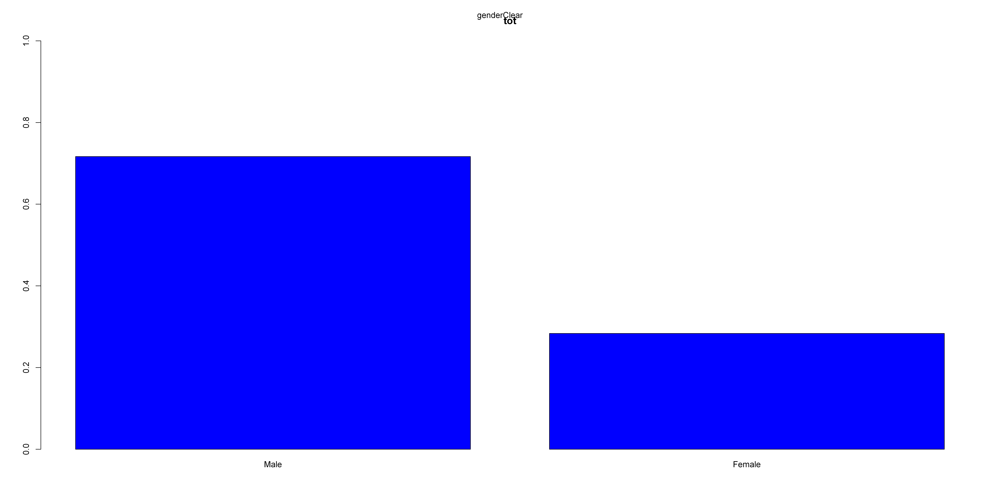

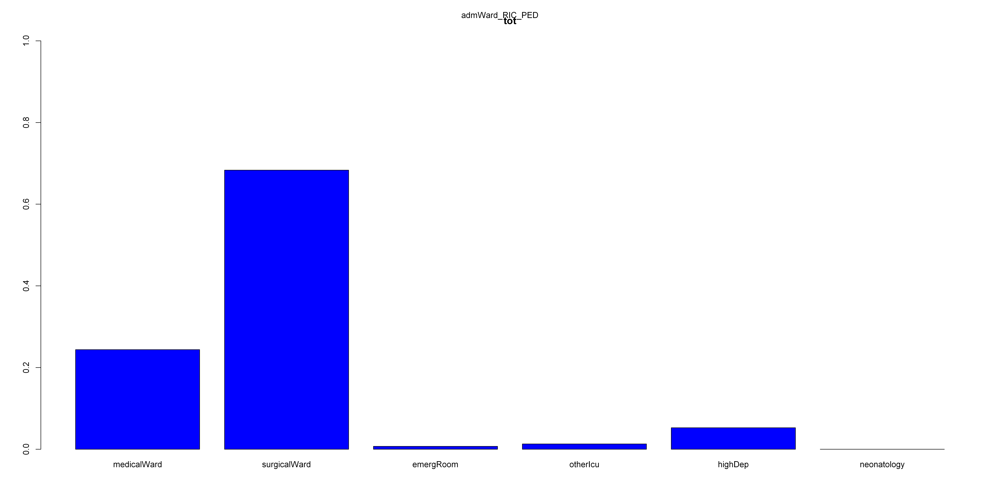

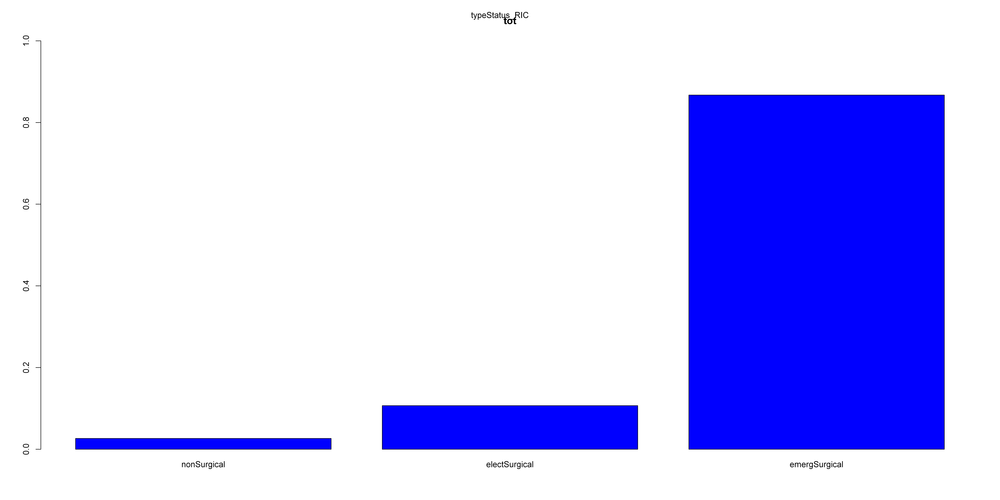

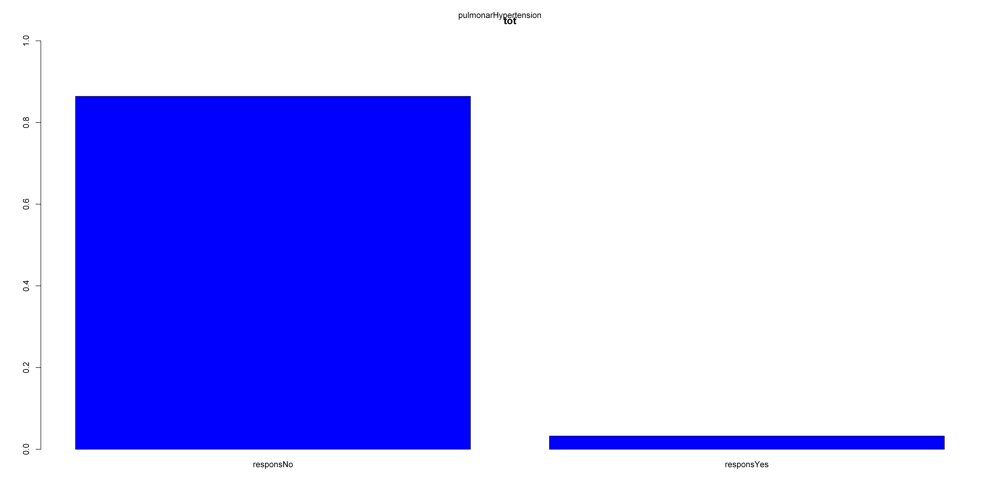

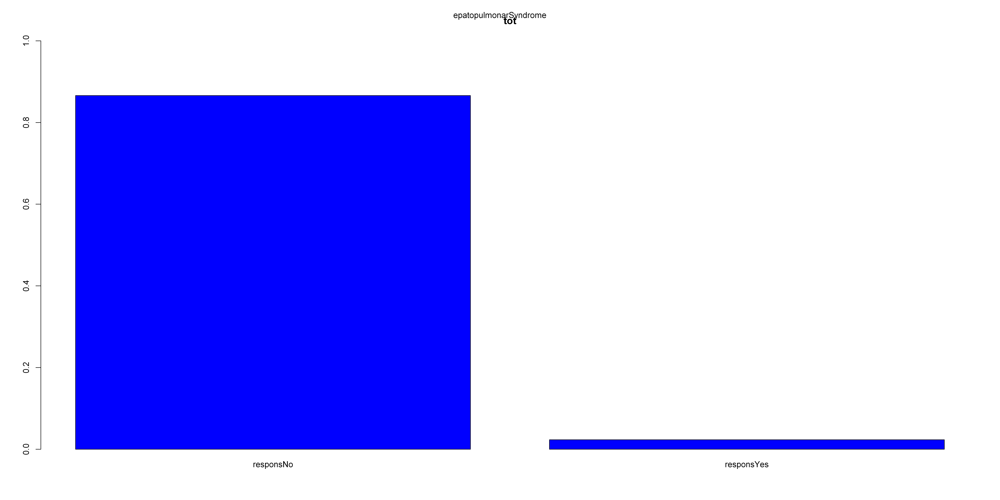

...

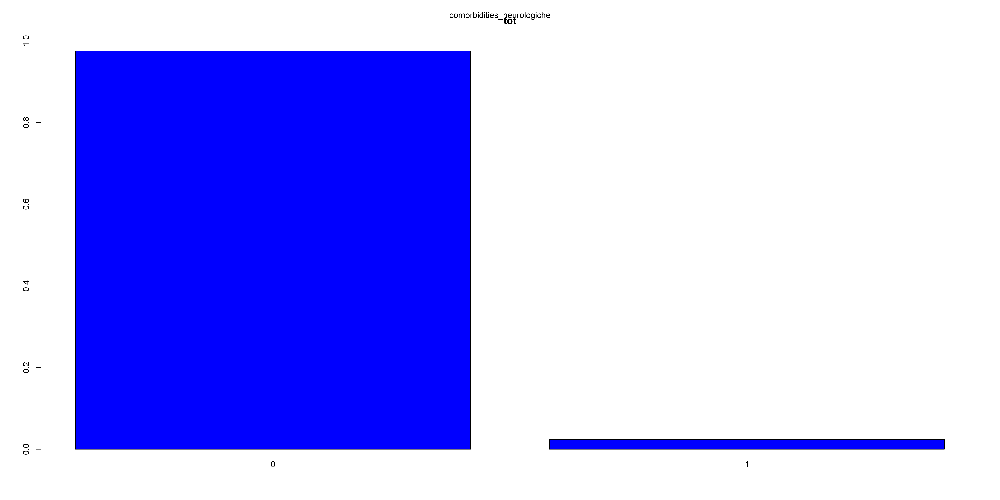

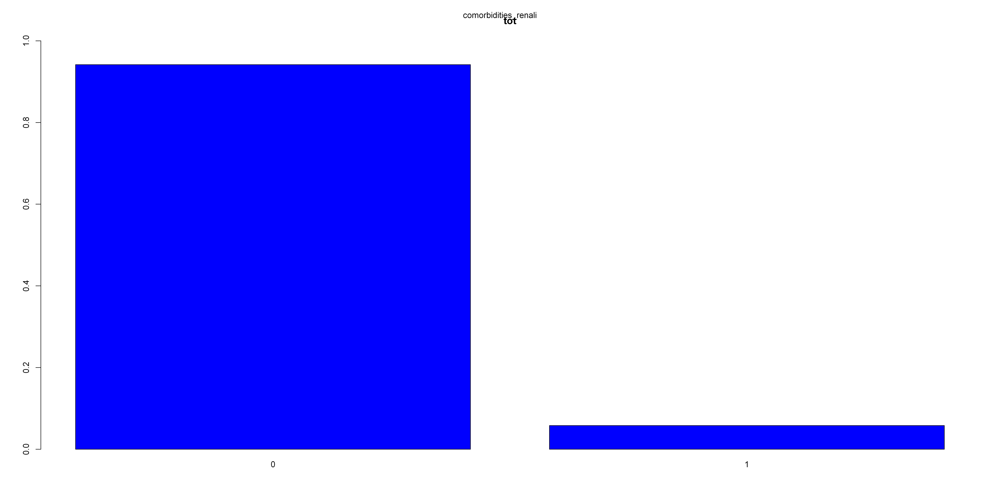

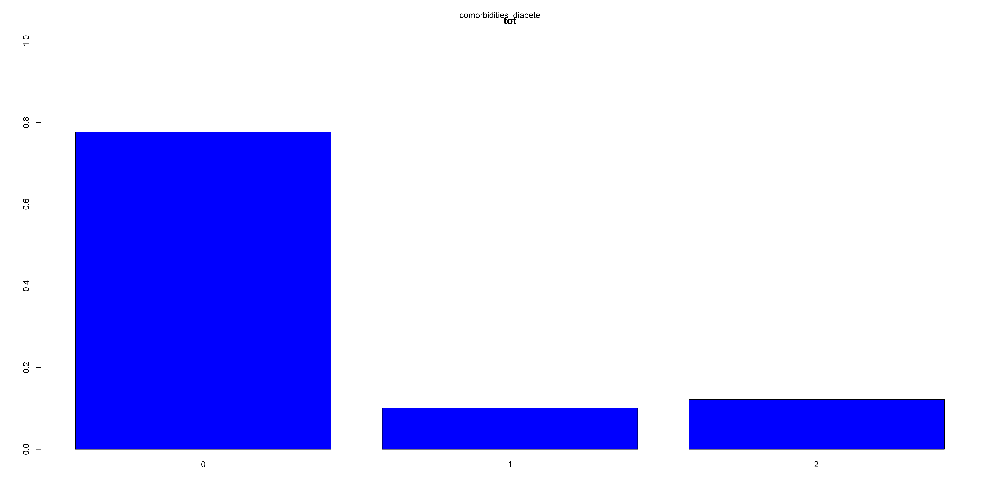

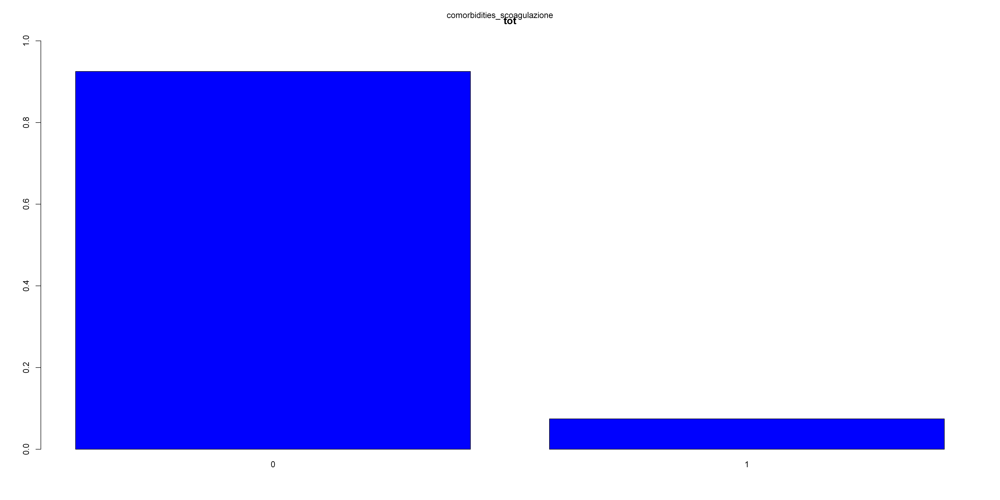

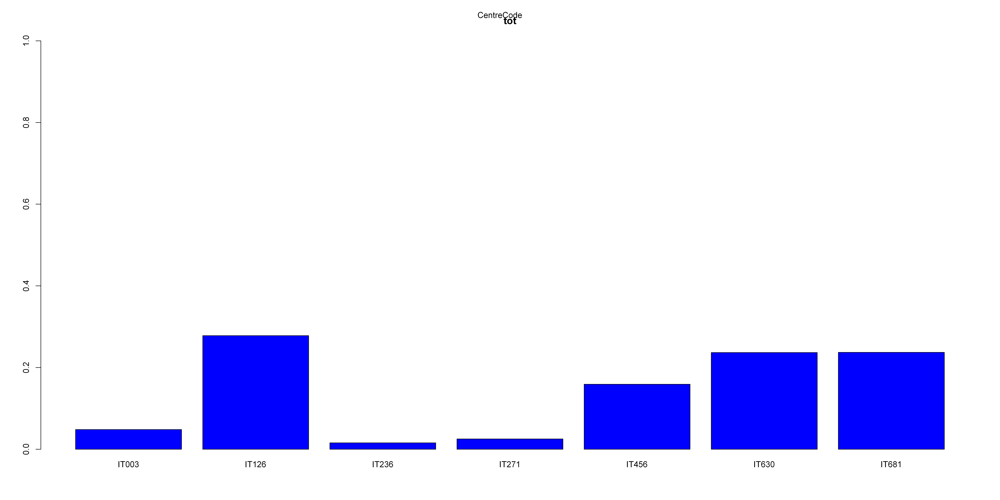

In [89]:
descrittiva_discrete_tot(df_discrete_tot)

In [90]:
descrittiva_discrete2_tot(df_discrete_tot)

[1] "genderClear"
[1] "tot"

     Male    Female 
0.7166577 0.2833423 




[1] "admWard_RIC_PED"
[1] "tot"

 medicalWard surgicalWard    emergRoom     otherIcu      highDep  neonatology 
 0.243837085  0.683815648  0.006966774  0.012861736  0.052518757  0.000000000 




[1] "typeStatus_RIC"
[1] "tot"

  nonSurgical electSurgical emergSurgical 
   0.02624531    0.10658811    0.86716658 




[1] "pulmonarHypertension"
[1] "tot"

 responsNo responsYes 
0.96413628 0.03586372 




[1] "epatopulmonarSyndrome"
[1] "tot"

 responsNo responsYes 
0.97409639 0.02590361 




[1] "BleedingEsophagGastric"
[1] "tot"

 responsNo responsYes 
 0.8090963  0.1909037 




[1] "prevLiverTransplant"
[1] "tot"

 responsNo responsYes 
0.95803783 0.04196217 




[1] "presentRefractAscites"
[1] "tot"

  priority       mild     severe   notLevel 
0.04939759 0.17771084 0.18554217 0.58734940 




[1] "tipps"
[1] "tot"

 responsNo responsYes 
 0.8911483  0.1088517 




[1] "thrombosisDegreeWithNone"
[1] "tot"

    de

In [92]:
descrittiva_continue_tot(df_continue_tot)

[1] "tot"
[1] "age"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   3.00   52.00   58.00   56.47   63.00   75.00 




[1] "tot"
[1] "degenzaPreTra"
    Min.  1st Qu.   Median     Mean  3rd Qu.     Max.     NA's 
-260.000    0.000    1.000    6.287    1.000  365.000       11 




[1] "tot"
[1] "bilirubinaTotale"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.000   0.960   2.060   5.641   5.100  88.000     198 




[1] "tot"
[1] "INR"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.660   1.190   1.400   1.602   1.780  10.000     198 




[1] "tot"
[1] "serumCreatinine"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  0.230   0.700   0.870   1.092   1.120  10.720     197 




[1] "tot"
[1] "Sodiemia"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  119.0   135.0   138.0   137.6   140.0   166.0     202 




[1] "tot"
[1] "ratioPaO2FiO2"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   50.0   300.0   387.0   367.5   433.0   500.0